In [6]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [26]:
df = pd.read_csv('DTP_DATA_2025_PROCESSED.csv')
df = df.drop('Unnamed: 0', axis=1)
print(df.shape)
features_number = df.shape[1]
# df.head(5)

C:\Users\Настя\AppData\Local\Temp\ipykernel_8576\656102643.py:1: DtypeWarning: Columns (4,5) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv('DTP_DATA_2025_PROCESSED.csv')


(1323567, 59)


In [27]:
df.columns

Index(['RTA type', 'date', 'traffic changes info', 'COORD_L', 'COORD_W', 'dor',
       'dor_k', 'road significance', 'factors influenced traffic',
       'street significance', 'road network maintenance defects',
       'RTA-adjacent road objects', 'lighting', 's_dtp',
       'road surface condition', 'RTA site road objects', 'weather',
       'RTA vehicle number', 'RTA participants number', 'RTA number',
       'number of deaths', 'number of wounded', 'RTA time',
       'any TV technical failures', 'any non-private vehicles',
       'any russian vehicles', 'any white vehicles', 'any black vehicles',
       'any colored vehicles', 'any drunk drivers', 'any female drivers',
       'any escaped participants', 'any concomitant traffic violations',
       'any injuries without safety belt', 'num drunk participants',
       'num child restraints', 'num cyclists', 'num pedestrians',
       'min vehicles age', 'max vehicles age', 'avg vehicles age',
       'num A-class vehicles', 'num B-class

In [28]:
# избавимся от наблюдений, где не указано название дороги (надеемся восстановить в будущем)

df = df[df['dor'].notna()]
print(f"Observations left after deleting NaN in 'dor' feature: {df.shape[0]}")

Observations left after deleting NaN in 'dor' feature: 473242


In [29]:
df.head()

,RTA type,date,traffic changes info,COORD_L,COORD_W,dor,dor_k,road significance,factors influenced traffic,street significance,...,num rear-wheel-drive vehicles,num four-wheel-drive vehicles,num guilty objects,share guilty vehicles,fatal traffic violation(s),num fatal traffic violations,bodily harm,guilty drivers avg experience,drivers avg experience,number fatal traffic violations
2,Опрокидывание,31.01.2015,Режим движения не изменялся,81.151944,53.740000,Романово - Завьялово - Баево - Камень-на-Оби,5.0,Региональная или межмуниципальная (дорога реги...,Сведения отсутствуют,Вне НП,...,0,0,1,1.0,{'Другие нарушения ПДД водителем'},0,"{'Раненый, находящийся (находившийся) на амбу...",17.0,17.0,1
4,Столкновение,30.01.2015,Режим движения не изменялся,85.018056,51.684444,Куяган - Куяча - Тоурак,6.0,Региональная или межмуниципальная (дорога реги...,Сведения отсутствуют,Вне НП,...,0,0,1,0.5,{'Нарушение правил расположения ТС на проезжей...,0,"{'Раненый, находящийся (находившийся) на амбу...",7.0,10.0,1
7,Столкновение,30.01.2015,Режим движения не изменялся,81.250000,53.818056,Барнаул - Камень-на-Оби - граница Новосибирско...,5.0,Региональная или межмуниципальная (дорога реги...,Сведения отсутствуют,Вне НП,...,0,0,1,0.5,{'Нарушение правил расположения ТС на проезжей...,0,"{'Раненый, находящийся (находившийся) на амбу...",2.0,15.5,1
29,Опрокидывание,24.01.2015,Режим движения не изменялся,51.000000,84.000000,Быканов Мост - Солоновка - Солонешное - границ...,7.0,Региональная или межмуниципальная (дорога реги...,Сведения отсутствуют,Вне НП,...,0,0,1,1.0,{'Несоответствие скорости конкретным условиям ...,0,"{'Раненый, находящийся (находившийся) на амбу...",26.0,26.0,1
31,Опрокидывание,23.01.2015,Режим движения не изменялся,84.000000,53.000000,Быканов Мост - Солоновка - Солонешное - границ...,7.0,Региональная или межмуниципальная (дорога реги...,Сведения отсутствуют,Вне НП,...,0,0,1,1.0,{'Нарушение правил расположения ТС на проезжей...,0,"{'Раненый, находящийся (находившийся) на амбу...",18.0,18.0,1


Для формирования финальных датасетов в нашей задаче нам необходимо отфильтровать наблюдения, которые произошли вне черты города, так как аварии в НП происходят при кардинально других характеристиках и не могут быть поставлены в сравнение с платными трассами.

Как мы знаем из файла `getting started with the data.ipynb`, переменная `NP`, или населённый пункт, оказалась абсолютно бесполезной, так как показывала ближайший в аварии населённый пункт, а не то, произошла авария в НП или нет, и была удалена из данных. Однако в нашем распоряжении осталась переменная `street significance`, которая отражает реальную ситуацию с тем, где произошла авария.

In [30]:
df['street significance'].unique()

array(['Вне НП', 'Магистральные улицы общегородского значения',
       'Магистральные улицы районного значения',
       'Улицы и дороги местного значения в жилой застройке',
       'Главные улицы', 'Поселковые дороги', 'Основные улицы',
       'Магистральные дороги', 'Назначение неизвестно', 'Проезды',
       'Второстепенные улицы в жилой застройке (переулки)',
       'Улицы и дороги местного значения научно-производственных промышленных и коммунально-складских районов',
       'Иные места', 'Основные улицы в жилой застройке',
       'Улицы и дороги местного значения в производственных, промышленных и коммунально-складских зонах',
       'Парковые дороги, пешеходные улицы (пешеходные зоны)',
       'Парковые дороги', 'Пешеходные улицы',
       'Хозяйственные проезды, скотопрогоны', 'Велосипедные дорожки'],
      dtype=object)

Нас интересуют аварии, для которых указаны значения 'Вне НП', 'Магистральные дороги' и 'Назначение неизвестно'.

In [31]:
df = df[(df['street significance'] == 'Вне НП') | (df['street significance'] == 'Назначение неизвестно') | (df['street significance'] == 'Магистральные дороги')]
df.shape[0]

440178

# Panel dataset 
(unit of observation ─ road section × month, for **analysis of accident frequency**)

In [ ]:
df['date'] = pd.to_datetime(df['date'])

# извлечём месяц и год из колонки 'date'
df['year_month'] = df['date'].dt.to_period('M')

useful_columns = [
    'dor',
    'year_month',
    'any drunk drivers',
    'any concomitant traffic violations'
]

panel_data = df.groupby(['dor', 'year_month']).size().reset_index(name='number_of_accidents')
panel_data = panel_data.sort_values(by='year_month')
panel_data

C:\Users\Настя\AppData\Local\Temp\ipykernel_30648\1542498936.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['date'] = pd.to_datetime(df['date'])
C:\Users\Настя\AppData\Local\Temp\ipykernel_30648\1542498936.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['year_month'] = df['date'].dt.to_period('M')


,dor,year_month,number_of_accidents
100895,Омск - Муромцево - Седельниково,2015-01,3
49834,ИНАЯ,2015-01,8
60819,Канск-Абан-Богучаны,2015-01,4
96029,ОБОЯНЬ-СОЛНЦЕВО-МАНТУРОВО-МАЛЫЕ КРЮКИ-ПОТОПАХИНО,2015-01,1
87656,Мосальск - Барятино - Добрая,2015-01,1
...,...,...,...
138533,Сельцы - Труфанково,2024-06,1
177686,иные дороги Елизовского района,2024-06,1
20266,БОРИСОГЛЕБСК - БОГАНА - МАХРОВКА,2024-06,1
97780,ОСТРОГОЖСК - АЛЕКСЕЕВКА - ЗАСОСНА - Х.ШИНКИН,2024-06,1


In [10]:
panel_data['number_of_accidents'].value_counts()

number_of_accidents
1      127798
2       26052
3       10096
4        5110
5        3069
        ...  
120         1
169         1
139         1
113         1
118         1
Name: count, Length: 126, dtype: int64

In [ ]:
dor_uniq = df['dor'].unique().tolist()

russian_toll_roads = ['М-1 ', 'М-3 ', 'М-4 ', 'М-11 ', 'М-12 ']
# russian_toll_roads = ['М-1 ', 'М-3 ', 'М-4 ']
toll_road_names = list()

for dor in dor_uniq:
    for toll_road in russian_toll_roads:
        try:
            if toll_road in dor and 'подъездная' not in dor.lower():
                toll_road_names.append(dor)
                break
        except TypeError:
            continue

# print(len(toll_road_names))

toll_roads_df = df[df['dor'].isin(toll_road_names)]
print(f"Number of observations of toll road accidents: {toll_roads_df.shape[0]}")
print('-----')
toll_roads_df.head()

In [ ]:
toll_roads_df['date'] = pd.to_datetime(toll_roads_df['date'])

# извлечём месяц и год из колонки 'date'
toll_roads_df['year_month'] = toll_roads_df['date'].dt.to_period('M')

toll_roads_df_panel = toll_roads_df.groupby(['dor', 'year_month']).size().reset_index(name='number_of_accidents')
toll_roads_df_panel['number_of_accidents'].value_counts()

C:\Users\Настя\AppData\Local\Temp\ipykernel_30648\1108366056.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  toll_roads_df['date'] = pd.to_datetime(toll_roads_df['date'])
C:\Users\Настя\AppData\Local\Temp\ipykernel_30648\1108366056.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  toll_roads_df['year_month'] = toll_roads_df['date'].dt.to_period('M')


number_of_accidents
1      412
2      142
3       77
4       46
5       44
      ... 
131      1
116      1
124      1
89       1
93       1
Name: count, Length: 112, dtype: int64

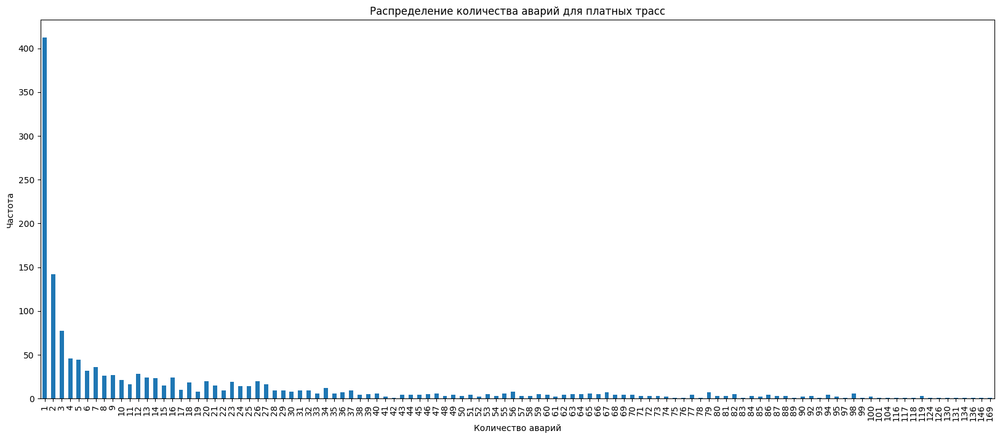

In [54]:
import matplotlib.pyplot as plt

# Строим график распределения количества аварий
plt.figure(figsize=(20, 8))
toll_roads_df_panel['number_of_accidents'].value_counts().sort_index().plot(kind='bar')

# Настроим заголовки и подписи
plt.title('Распределение количества аварий для платных трасс')
plt.xlabel('Количество аварий')
plt.ylabel('Частота')
plt.xticks(rotation=90)

# Показываем график
plt.show()


In [49]:
toll_roads_df_panel = toll_roads_df_panel.sort_values(by='year_month')
toll_roads_df_panel

,dor,year_month,number_of_accidents
989,"М-4 Платные участки от Москвы через Воронеж, Р...",2015-01,7
1319,Ростов-на-Дону (от М-4 «Дон»)- Ставрополь (в г...,2015-01,2
254,М-1 Беларусь Москва - граница с Республикой Бе...,2015-01,23
368,М-3 Обход г. Калуга от М-3 «Украина»,2015-01,1
405,М-3 Подъезд к городу Калуга от а/д М-3,2015-01,1
...,...,...,...
367,"М-2 Крым, соединительная дорога Белгород - М-4...",2024-06,1
477,М-3 Украина (Москва-Украина),2024-06,3
1244,Р-22 Каспий Автомобильная дорога М-4 Дон - Там...,2024-06,24
133,Киевское шоссе (М-3 Украина Москва-Украина),2024-06,1


In [ ]:
start_date = pd.to_datetime('2015-01')
end_date = pd.to_datetime('2024-06')
all_months = pd.date_range(start=start_date, end=end_date, freq='MS').to_period('M')

road_list = panel_data['dor'].unique()
full_index = pd.MultiIndex.from_product([road_list, all_months], names=['dor', 'year_month'])

df_full_panel = pd.DataFrame(index=full_index).reset_index()
df_full_panel = df_full_panel.merge(panel_data, on=['dor', 'year_month'], how='left')

df_full_panel['number_of_accidents'] = df_full_panel['number_of_accidents'].fillna(0)

df_full_panel['year_month'] = df_full_panel['year_month'].astype(str)
df_full_panel['number_of_accidents'] = df_full_panel['number_of_accidents'].astype(int)
df_full_panel.shape[0]

,dor,year_month,number_of_accidents
0,Омск - Муромцево - Седельниково,2015-01,3
1,Омск - Муромцево - Седельниково,2015-02,3
2,Омск - Муромцево - Седельниково,2015-03,0
3,Омск - Муромцево - Седельниково,2015-04,1
4,Омск - Муромцево - Седельниково,2015-05,0
...,...,...,...
2650495,ОСТРОГОЖСК - АЛЕКСЕЕВКА - ЗАСОСНА - Х.ШИНКИН,2024-02,0
2650496,ОСТРОГОЖСК - АЛЕКСЕЕВКА - ЗАСОСНА - Х.ШИНКИН,2024-03,0
2650497,ОСТРОГОЖСК - АЛЕКСЕЕВКА - ЗАСОСНА - Х.ШИНКИН,2024-04,0
2650498,ОСТРОГОЖСК - АЛЕКСЕЕВКА - ЗАСОСНА - Х.ШИНКИН,2024-05,0


In [ ]:
road_list = toll_roads_df_panel['dor'].unique()
full_index = pd.MultiIndex.from_product([road_list, all_months], names=['dor', 'year_month'])

df_full_toll_panel = pd.DataFrame(index=full_index).reset_index()
df_full_toll_panel = df_full_toll_panel.merge(toll_roads_df_panel, on=['dor', 'year_month'], how='left')

df_full_toll_panel['number_of_accidents'] = df_full_toll_panel['number_of_accidents'].fillna(0)

df_full_toll_panel['year_month'] = df_full_toll_panel['year_month'].astype(str)
df_full_toll_panel['number_of_accidents'] = df_full_toll_panel['number_of_accidents'].astype(int)
df_full_toll_panel

,dor,year_month,number_of_accidents
0,"М-4 Платные участки от Москвы через Воронеж, Р...",2015-01,7
1,"М-4 Платные участки от Москвы через Воронеж, Р...",2015-02,2
2,"М-4 Платные участки от Москвы через Воронеж, Р...",2015-03,9
3,"М-4 Платные участки от Москвы через Воронеж, Р...",2015-04,7
4,"М-4 Платные участки от Москвы через Воронеж, Р...",2015-05,3
...,...,...,...
9343,ВВЕДЕНКА-ПРИМ. К А-Д М-4 ДОН,2024-02,0
9344,ВВЕДЕНКА-ПРИМ. К А-Д М-4 ДОН,2024-03,0
9345,ВВЕДЕНКА-ПРИМ. К А-Д М-4 ДОН,2024-04,0
9346,ВВЕДЕНКА-ПРИМ. К А-Д М-4 ДОН,2024-05,1


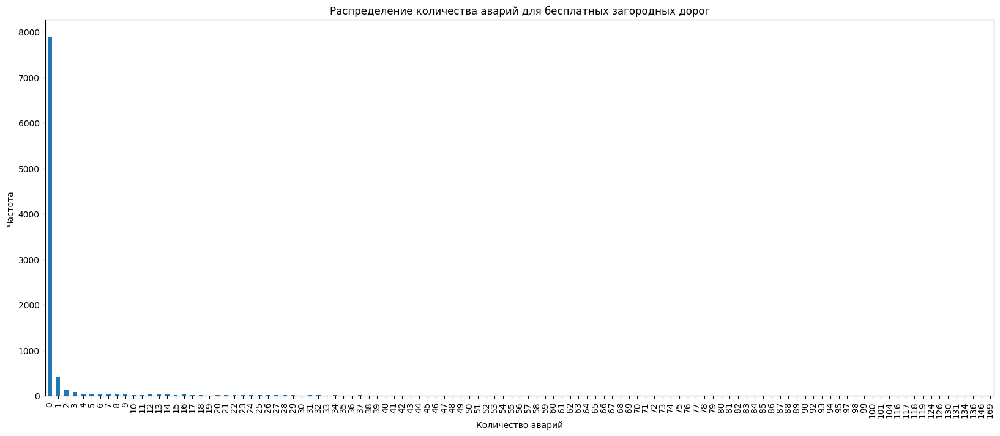

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(20, 8))
df_full_toll_panel['number_of_accidents'].value_counts().sort_index().plot(kind='bar')

plt.title('Распределение количества аварий для бесплатных загородных дорог')
plt.xlabel('Количество аварий')
plt.ylabel('Частота')
plt.xticks(rotation=90)

plt.show()

In [ ]:
exclude_toll_roads = df_full_toll_panel['dor'].tolist()

df_full_free_panel = df_full_panel[~df_full_panel['dor'].isin(exclude_toll_roads)]
print(df_full_free_panel.shape)
df_full_free_panel

(2641152, 3)


,dor,year_month,number_of_accidents
0,Омск - Муромцево - Седельниково,2015-01,3
1,Омск - Муромцево - Седельниково,2015-02,3
2,Омск - Муромцево - Седельниково,2015-03,0
3,Омск - Муромцево - Седельниково,2015-04,1
4,Омск - Муромцево - Седельниково,2015-05,0
...,...,...,...
2650495,ОСТРОГОЖСК - АЛЕКСЕЕВКА - ЗАСОСНА - Х.ШИНКИН,2024-02,0
2650496,ОСТРОГОЖСК - АЛЕКСЕЕВКА - ЗАСОСНА - Х.ШИНКИН,2024-03,0
2650497,ОСТРОГОЖСК - АЛЕКСЕЕВКА - ЗАСОСНА - Х.ШИНКИН,2024-04,0
2650498,ОСТРОГОЖСК - АЛЕКСЕЕВКА - ЗАСОСНА - Х.ШИНКИН,2024-05,0


In [ ]:
df_full_free_panel['number_of_accidents'].value_counts()

number_of_accidents
0      2459441
1       127386
2        25910
3        10019
4         5064
        ...   
113          1
95           1
109          1
105          1
116          1
Name: count, Length: 114, dtype: int64

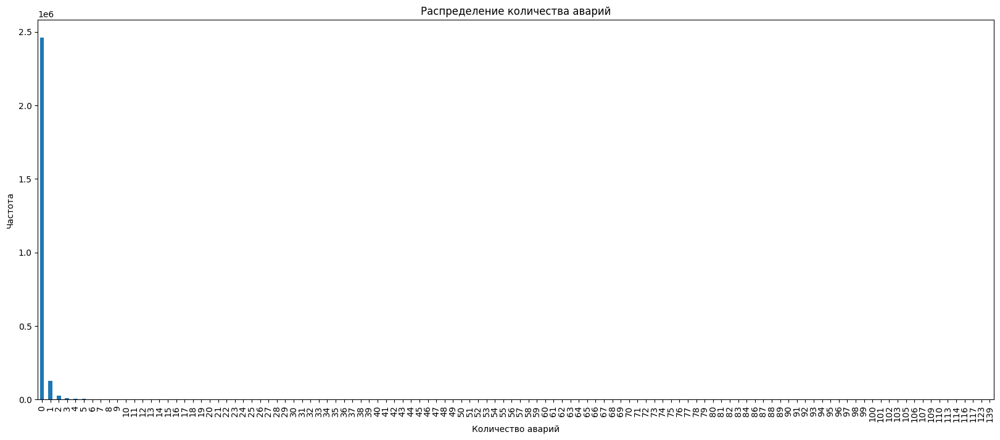

In [ ]:
plt.figure(figsize=(20, 8))
df_full_free_panel['number_of_accidents'].value_counts().sort_index().plot(kind='bar')

plt.title('Распределение количества аварий')
plt.xlabel('Количество аварий')
plt.ylabel('Частота')
plt.xticks(rotation=90)

plt.show()

# Accident-level dataset 
(unit of observation ─ individual accident, for **analysis of accident severity**)

In [ ]:
dor_uniq = df['dor'].unique().tolist()

russian_toll_roads = ['М-1 ', 'М-3 ', 'М-4 ', 'М-11 ', 'М-12 ']
# russian_toll_roads = ['М-1 ', 'М-3 ', 'М-4 ']
toll_road_names = list()

for dor in dor_uniq:
    for toll_road in russian_toll_roads:
        try:
            if toll_road in dor and 'подъездная' not in dor.lower():
                toll_road_names.append(dor)
                break
        except TypeError:
            continue

# print(len(toll_road_names))

toll_roads_df = df[df['dor'].isin(toll_road_names)]
print(f"Number of observations of toll road accidents: {toll_roads_df.shape[0]}")
print('-----')
toll_roads_df.head()

Number of observations of toll road accidents: 26555
-----


,RTA type,date,traffic changes info,COORD_L,COORD_W,dor,dor_k,road significance,factors influenced traffic,street significance,...,any injuries without safety belt,any child restraints,number of guilty objects,fatal traffic violation(s),number of fatal traffic violations,bodily harm,guilty drivers average experience,drivers average experience,year,year_month
23094,Столкновение,2015-01-27,Движение частично перекрыто,39.915886,45.30323,М-4 Дон Москва - Воронеж - Ростов-на-Дону - Кр...,1.0,Федеральная (дорога федерального значения),Сведения отсутствуют,Вне НП,...,0,0,1,{'Выезд на полосу встречного движения'},1,"{'Раненый, находящийся (находившийся) на амбу...",16.0,24.0,2015,2015-01
23115,Опрокидывание,2015-01-25,Режим движения не изменялся,39.701389,45.891944,М-4 Дон Москва - Воронеж - Ростов-на-Дону - Кр...,1.0,Федеральная (дорога федерального значения),Сведения отсутствуют,Вне НП,...,0,0,1,{'Нарушение правил перестроения'},1,"{'Раненый, находящийся (находившийся) на стаци...",13.0,13.0,2015,2015-01
23154,Столкновение,2015-01-22,Движение частично перекрыто,41.07822,44.55451,Р-217 Кавказ автомобильная дорога М-4 Дон - Вл...,1.0,Федеральная (дорога федерального значения),Сведения отсутствуют,Вне НП,...,0,0,1,{'Несоблюдение очередности проезда'},1,"{'Раненый, находящийся (находившийся) на стаци...",17.0,13.5,2015,2015-01
23159,Опрокидывание,2015-01-22,Режим движения не изменялся,38.1633,44.3146,М-4 Дон Москва - Воронеж - Ростов-на-Дону - Кр...,3.0,Федеральная (дорога федерального значения),Сведения отсутствуют,Вне НП,...,0,0,1,{'Несоответствие скорости конкретным условиям ...,1,"{'Раненый, находящийся (находившийся) на амбу...",27.0,27.0,2015,2015-01
23168,Столкновение,2015-01-22,Движение частично перекрыто,40.22636,45.37034,Р-217 Кавказ автомобильная дорога М-4 Дон - Вл...,2.0,Федеральная (дорога федерального значения),Сведения отсутствуют,Вне НП,...,0,0,1,{'Нарушение правил перестроения'},1,"{'Раненый, находящийся (находившийся) на амбу...",3.0,20.5,2015,2015-01


### DBSCAN for toll roads (panel)

In [ ]:
toll_roads_df["COORD_W"] = pd.to_numeric(toll_roads_df["COORD_W"], errors="coerce")
toll_roads_df["COORD_L"] = pd.to_numeric(toll_roads_df["COORD_L"], errors="coerce")

C:\Users\Настя\AppData\Local\Temp\ipykernel_30648\48664001.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  toll_roads_df["COORD_W"] = pd.to_numeric(toll_roads_df["COORD_W"], errors="coerce")
C:\Users\Настя\AppData\Local\Temp\ipykernel_30648\48664001.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  toll_roads_df["COORD_L"] = pd.to_numeric(toll_roads_df["COORD_L"], errors="coerce")


In [21]:
print(toll_roads_df[["COORD_W", "COORD_L"]].dtypes)
print(toll_roads_df[["COORD_W", "COORD_L"]].isnull().sum())
toll_roads_df.dropna(subset=["COORD_W", "COORD_L"], inplace=True)

COORD_W    float64
COORD_L    float64
dtype: object
COORD_W    0
COORD_L    0
dtype: int64


C:\Users\Настя\AppData\Local\Temp\ipykernel_30648\1142465850.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  toll_roads_df.dropna(subset=["COORD_W", "COORD_L"], inplace=True)


In [39]:
from sklearn.cluster import DBSCAN
import folium

X = toll_roads_df[["COORD_W", "COORD_L"]].values

# dbscan = DBSCAN(eps=0.035, min_samples=5).fit(X)
# dbscan = DBSCAN(eps=1/6371.0, min_samples=5, metric="haversine").fit(np.radians(X))
dbscan = DBSCAN(eps=0.2/6371.0, min_samples=5, metric="haversine").fit(np.radians(X))
toll_roads_df["cluster"] = dbscan.labels_

center_lat = toll_roads_df["COORD_L"].mean()
center_lon = toll_roads_df["COORD_W"].mean()

m = folium.Map(location=[center_lat, center_lon], zoom_start=10)

# Цвета для кластеров (оставляем шум (-1) серым)
import random
cluster_colors = {label: f"#{random.randint(0, 0xFFFFFF):06x}" for label in toll_roads_df["cluster"].unique()}
cluster_colors[-1] = "gray"  # Шум (outliers)

for idx, row in toll_roads_df.iterrows():
    color = "red" if row["cluster"] != -1 else "gray"  # Красный = кластер, серый = шум
    folium.CircleMarker(
        location=[row["COORD_W"], row["COORD_L"]],
        radius=4,
        color=color,
        fill=True,
        fill_color=color,
        fill_opacity=0.6
    ).add_to(m)

m

C:\Users\Настя\AppData\Local\Temp\ipykernel_30648\3594387208.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  toll_roads_df["cluster"] = dbscan.labels_


In [35]:
toll_roads_df["cluster"].value_counts().describe()

count     645.000000
mean       41.165891
std       203.212237
min         4.000000
25%         6.000000
50%        11.000000
75%        26.000000
max      4704.000000
Name: count, dtype: float64

### Other

In [37]:
toll_roads_df['bodily harm'].nunique()

393

# Panel 2

In [ ]:
exclude_toll_roads = toll_roads_df['dor'].tolist()

free_roads_df = df[~df['dor'].isin(exclude_toll_roads)]
print(free_roads_df.shape)
free_roads_df.head()

(386404, 60)


,RTA type,date,traffic changes info,COORD_L,COORD_W,dor,dor_k,road significance,factors influenced traffic,street significance,...,any injuries without safety belt,any child restraints,number of guilty objects,fatal traffic violation(s),number of fatal traffic violations,bodily harm,guilty drivers average experience,drivers average experience,year,year_month
2,Опрокидывание,2015-01-31,Режим движения не изменялся,81.151944,53.740000,Романово - Завьялово - Баево - Камень-на-Оби,5.0,Региональная или межмуниципальная (дорога реги...,Сведения отсутствуют,Вне НП,...,1,0,1,{'Другие нарушения ПДД водителем'},1,"{'Раненый, находящийся (находившийся) на стаци...",17.0,17.0,2015,2015-01
4,Столкновение,2015-01-30,Режим движения не изменялся,85.018056,51.684444,Куяган - Куяча - Тоурак,6.0,Региональная или межмуниципальная (дорога реги...,Сведения отсутствуют,Вне НП,...,0,0,1,{'Нарушение правил расположения ТС на проезжей...,1,"{'Раненый, находящийся (находившийся) на стаци...",7.0,10.0,2015,2015-01
7,Столкновение,2015-01-30,Режим движения не изменялся,81.250000,53.818056,Барнаул - Камень-на-Оби - граница Новосибирско...,5.0,Региональная или межмуниципальная (дорога реги...,Сведения отсутствуют,Вне НП,...,0,0,1,{'Нарушение правил расположения ТС на проезжей...,1,"{'Раненый, находящийся (находившийся) на амбу...",2.0,15.5,2015,2015-01
29,Опрокидывание,2015-01-24,Режим движения не изменялся,51.000000,84.000000,Быканов Мост - Солоновка - Солонешное - границ...,7.0,Региональная или межмуниципальная (дорога реги...,Сведения отсутствуют,Вне НП,...,0,0,1,{'Несоответствие скорости конкретным условиям ...,1,"{'Раненый, находящийся (находившийся) на амбу...",26.0,26.0,2015,2015-01
31,Опрокидывание,2015-01-23,Режим движения не изменялся,84.000000,53.000000,Быканов Мост - Солоновка - Солонешное - границ...,7.0,Региональная или межмуниципальная (дорога реги...,Сведения отсутствуют,Вне НП,...,0,0,1,{'Нарушение правил расположения ТС на проезжей...,1,"{'Раненый, находящийся (находившийся) на амбу...",18.0,18.0,2015,2015-01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1255000,Столкновение,2022-01-01,Режим движения не изменялся,56.245752,67.242043,"г. Нарьян-Мар - г. Усинск, участок п. Харьягин...",1.0,Региональная или межмуниципальная (дорога реги...,Сведения отсутствуют,Назначение неизвестно,...,0,1,1,{'Нарушение правил расположения ТС на проезжей...,1,{'Получил телесные повреждения с показанием к ...,4.0,10.5,2022,2022-01
1255008,Опрокидывание,2022-08-15,Режим движения не изменялся,53.969736,67.933235,"г. Нарьян-Мар - г. Усинск, искусственное дорож...",5.0,Региональная или межмуниципальная (дорога реги...,Сведения отсутствуют,Вне НП,...,1,0,1,{'Нарушение правил расположения ТС на проезжей...,1,"{'Раненый, находящийся (находившийся) на стаци...",95.0,53.0,2022,2022-08
1255011,Опрокидывание,2022-10-30,Режим движения не изменялся,47.746153,66.732308,Нижняя Пеша - Верхняя Пеша,8.0,Региональная или межмуниципальная (дорога реги...,Сведения отсутствуют,Назначение неизвестно,...,1,0,1,{'Несоответствие скорости конкретным условиям ...,1,{'Получил телесные повреждения с показанием к ...,95.0,95.0,2022,2022-10
1255014,Съезд с дороги,2022-12-18,Режим движения не изменялся,55.731164,67.417464,"г. Нарьян-Мар - г. Усинск, участок г. Нарьян-М...",5.0,Региональная или межмуниципальная (дорога реги...,Сведения отсутствуют,Назначение неизвестно,...,1,0,1,{'Нарушение правил расположения ТС на проезжей...,1,{'Скончался при транспортировке'},31.0,31.0,2022,2022-12


C:\Users\Настя\AppData\Local\Temp\ipykernel_30648\211782439.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  exclude_toll_roads_df['date'] = pd.to_datetime(exclude_toll_roads_df['date'], errors='coerce')
C:\Users\Настя\AppData\Local\Temp\ipykernel_30648\211782439.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  exclude_toll_roads_df['year'] = exclude_toll_roads_df['date'].dt.year
C:\Users\Настя\AppData\Local\Temp\ipykernel_30648\211782439.py:3: SettingWithCopyWarning: 
A value is trying to be set on a

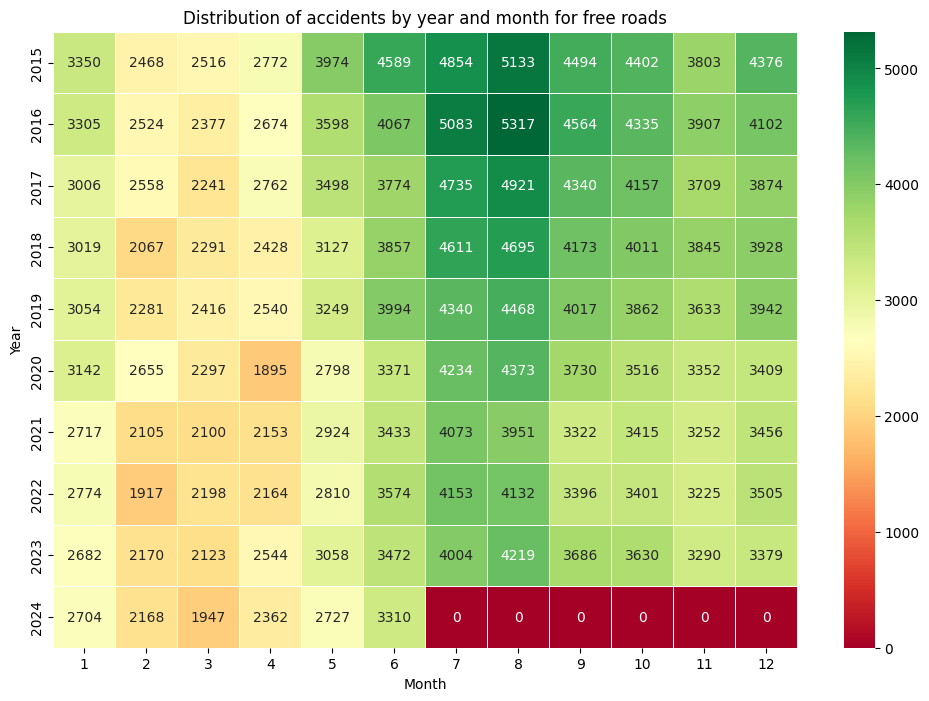

In [ ]:
free_roads_df['date'] = pd.to_datetime(free_roads_df['date'], errors='coerce')
free_roads_df['year'] = free_roads_df['date'].dt.year
free_roads_df['month'] = free_roads_df['date'].dt.month

accidents_by_year_month = free_roads_df.groupby(['year', 'month']).size()

import seaborn as sns
import matplotlib.pyplot as plt

accidents_by_year_month = accidents_by_year_month.unstack(fill_value=0)

plt.figure(figsize=(12, 8))
sns.heatmap(accidents_by_year_month, annot=True, cmap='RdYlGn', fmt='d', linewidths=0.5)

plt.title('Distribution of accidents by year and month for free roads')
plt.xlabel('Month')
plt.ylabel('Year')
plt.show()

C:\Users\Настя\AppData\Local\Temp\ipykernel_30648\1319995711.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  toll_roads_df['date'] = pd.to_datetime(toll_roads_df['date'], errors='coerce')
C:\Users\Настя\AppData\Local\Temp\ipykernel_30648\1319995711.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  toll_roads_df['year'] = toll_roads_df['date'].dt.year
C:\Users\Настя\AppData\Local\Temp\ipykernel_30648\1319995711.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataF

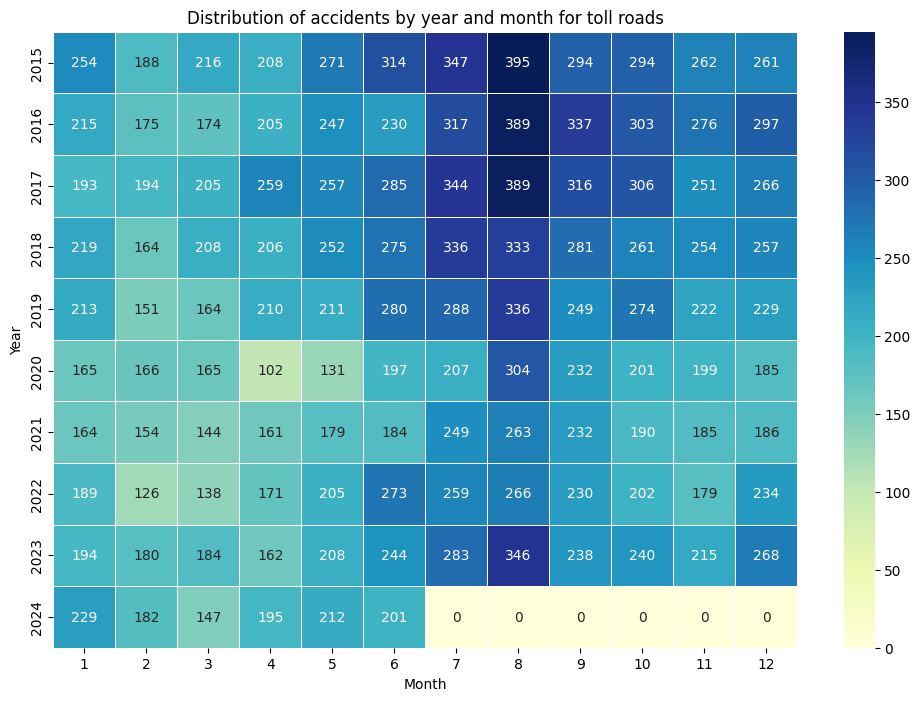

In [88]:
toll_roads_df['date'] = pd.to_datetime(toll_roads_df['date'], errors='coerce')
toll_roads_df['year'] = toll_roads_df['date'].dt.year
toll_roads_df['month'] = toll_roads_df['date'].dt.month

accidents_by_year_month = toll_roads_df.groupby(['year', 'month']).size()

import seaborn as sns
import matplotlib.pyplot as plt

accidents_by_year_month = accidents_by_year_month.unstack(fill_value=0)

plt.figure(figsize=(12, 8))
sns.heatmap(accidents_by_year_month, annot=True, cmap='YlGnBu', fmt='d', linewidths=0.5)

plt.title('Distribution of accidents by year and month for toll roads')
plt.xlabel('Month')
plt.ylabel('Year')
plt.show()

In [ ]:
free_roads_df['date'] = pd.to_datetime(free_roads_df['date'], errors='coerce')
free_roads_df['year'] = free_roads_df['date'].dt.year
free_roads_df['month'] = free_roads_df['date'].dt.month

accidents_by_year = free_roads_df.groupby('year').size()
free_accidents_by_year = accidents_by_year[:-1]

print(free_accidents_by_year)

year
2015    46731
2016    45853
2017    43575
2018    42052
2019    41796
2020    38772
2021    36901
2022    37249
2023    38257
dtype: int64


C:\Users\Настя\AppData\Local\Temp\ipykernel_30648\2433443626.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  exclude_toll_roads_df['date'] = pd.to_datetime(exclude_toll_roads_df['date'], errors='coerce')
C:\Users\Настя\AppData\Local\Temp\ipykernel_30648\2433443626.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  exclude_toll_roads_df['year'] = exclude_toll_roads_df['date'].dt.year
C:\Users\Настя\AppData\Local\Temp\ipykernel_30648\2433443626.py:3: SettingWithCopyWarning: 
A value is trying to be set o

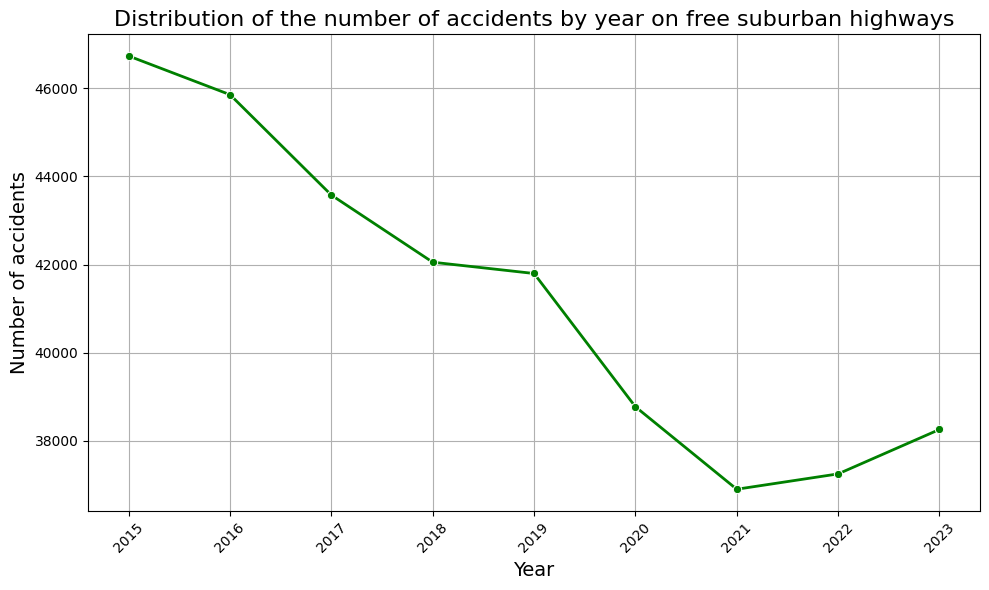

In [86]:
plt.figure(figsize=(10, 6))
sns.lineplot(x=free_accidents_by_year.index, y=free_accidents_by_year.values, marker='o', color='g', linewidth=2)

plt.title('Distribution of the number of accidents by year on free suburban highways', fontsize=16)
plt.xlabel('Year', fontsize=14)
plt.ylabel('Number of accidents', fontsize=14)
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()

plt.show()

In [76]:
toll_roads_df['date'] = pd.to_datetime(toll_roads_df['date'], errors='coerce')
toll_roads_df['year'] = toll_roads_df['date'].dt.year
toll_roads_df['month'] = toll_roads_df['date'].dt.month

accidents_by_year = toll_roads_df.groupby('year').size()
toll_accidents_by_year = accidents_by_year[:-1]

print(toll_accidents_by_year)

year
2015    3304
2016    3165
2017    3265
2018    3046
2019    2827
2020    2254
2021    2291
2022    2472
2023    2762
dtype: int64


C:\Users\Настя\AppData\Local\Temp\ipykernel_30648\3178303511.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  toll_roads_df['date'] = pd.to_datetime(toll_roads_df['date'], errors='coerce')
C:\Users\Настя\AppData\Local\Temp\ipykernel_30648\3178303511.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  toll_roads_df['year'] = toll_roads_df['date'].dt.year
C:\Users\Настя\AppData\Local\Temp\ipykernel_30648\3178303511.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataF

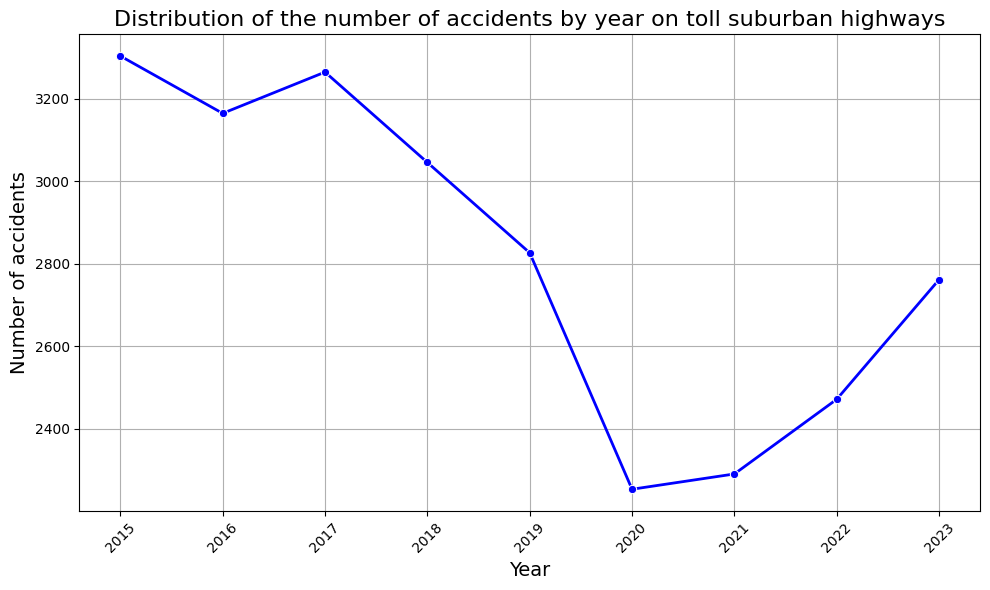

In [85]:
plt.figure(figsize=(10, 6))
sns.lineplot(x=toll_accidents_by_year.index, y=toll_accidents_by_year.values, marker='o', color='b', linewidth=2)

plt.title('Distribution of the number of accidents by year on toll suburban highways', fontsize=16)
plt.xlabel('Year', fontsize=14)
plt.ylabel('Number of accidents', fontsize=14)
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()

plt.show()